run this following command:

import Pkg; Pkg.add("Plots"); Pkg.add("OrdinaryDiffEq"); Pkg.add("ModelingToolkit")

In [3]:
using Plots, OrdinaryDiffEq, ModelingToolkit
gr()

G = 2.95912208286e-4
M = [
    1.00000597682,
    0.000954786104043,
    0.000285583733151,
    0.0000437273164546,
    0.0000517759138449,
    1 / 1.3e8
]
planets = ["Sun", "Jupiter", "Saturn", "Uranus", "Neptune", "Pluto"]

pos = [0.0 -3.5023653 9.0755314 8.310142 11.4707666 -15.5387357
       0.0 -3.8169847 -3.0458353 -16.2901086 -25.7294829 -25.2225594
       0.0 -1.5507963 -1.6483708 -7.2521278 -10.8169456 -3.1902382]
vel = [0.0 0.00565429 0.00168318 0.00354178 0.0028893 0.00276725
       0.0 -0.0041249 0.00483525 0.00137102 0.00114527 -0.00170702
       0.0 -0.00190589 0.00192462 0.00055029 0.00039677 -0.00136504]
tspan = (0.0, 400_000_000.0)

(0.0, 4.0e8)

In [4]:
const ∑ = sum
const N = 6
@variables t u(t)[1:3, 1:N]
u = collect(u)
D = Differential(t)
potential = -G *
            ∑(
    i -> ∑(j -> (M[i] * M[j]) / √(∑(k -> (u[k, i] - u[k, j])^2, 1:3)), 1:(i - 1)),
    2:N)

-0.000295912208286(7.692353667846155e-9 / sqrt((-(u(t))[1, 1] + (u(t))[1, 6])^2 + (-(u(t))[2, 1] + (u(t))[2, 6])^2 + (-(u(t))[3, 1] + (u(t))[3, 6])^2) + 2.1967979473153846e-12 / sqrt((-(u(t))[1, 3] + (u(t))[1, 6])^2 + (-(u(t))[2, 3] + (u(t))[2, 6])^2 + (-(u(t))[3, 3] + (u(t))[3, 6])^2) + 0.00028558544003356794 / sqrt((-(u(t))[1, 1] + (u(t))[1, 3])^2 + (-(u(t))[2, 1] + (u(t))[2, 3])^2 + (-(u(t))[3, 1] + (u(t))[3, 3])^2) + 4.372757780489954e-5 / sqrt((-(u(t))[1, 1] + (u(t))[1, 4])^2 + (-(u(t))[2, 1] + (u(t))[2, 4])^2 + (-(u(t))[3, 1] + (u(t))[3, 4])^2) + 0.0009547918106276825 / sqrt((-(u(t))[1, 1] + (u(t))[1, 2])^2 + (-(u(t))[2, 1] + (u(t))[2, 2])^2 + (-(u(t))[3, 1] + (u(t))[3, 2])^2) + 1.4786358763131087e-8 / sqrt((-(u(t))[1, 3] + (u(t))[1, 5])^2 + (-(u(t))[2, 3] + (u(t))[2, 5])^2 + (-(u(t))[3, 3] + (u(t))[3, 5])^2) + 7.344508492638461e-12 / sqrt((-(u(t))[1, 2] + (u(t))[1, 6])^2 + (-(u(t))[2, 2] + (u(t))[2, 6])^2 + (-(u(t))[3, 2] + (u(t))[3, 6])^2) + 1.2487810273779817e-8 / sqrt((-(u(t)

In [5]:
eqs = vec(@. D(D(u))) .~ .-ModelingToolkit.gradient(potential, vec(u)) ./
                         repeat(M, inner = 3)
@named sys = ODESystem(eqs, t)
ss = structural_simplify(sys)
prob = ODEProblem(ss, [vec(u .=> pos); vec(D.(u) .=> vel)], tspan)
sol = solve(prob, Tsit5());

┌ Warning: Independent variable t should be defined with @independent_variables t.
└ @ ModelingToolkit /Users/elijahphifer/.julia/packages/ModelingToolkit/CCIoy/src/utils.jl:119
┌ Warning: At t=233728.98858293146, dt was forced below floating point epsilon 2.9103830456733704e-11, and step error estimate = 1.3210600280761235. Aborting. There is either an error in your model specification or the true solution is unstable (or the true solution can not be represented in the precision of Float64).
└ @ SciMLBase /Users/elijahphifer/.julia/packages/SciMLBase/tEuIM/src/integrator_interface.jl:609


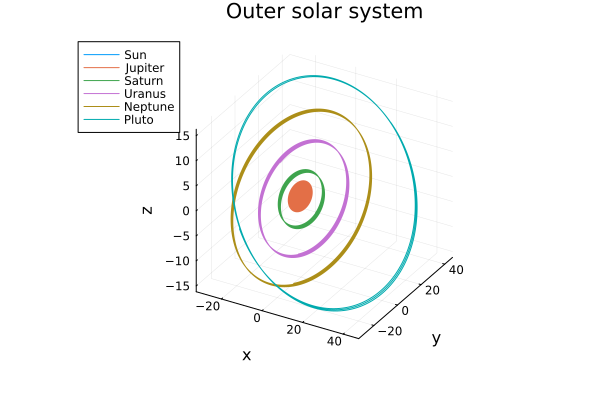

In [14]:
plt = plot()
for i in 1:N
    plot!(plt, sol, idxs = (u[:, i]...,), lab = planets[i])
end
plot!(plt; xlab = "x", ylab = "y", zlab = "z", title = "Outer solar system")